<h1 align="center">Visual Behavior Neuropixels SWDB 2022 </h1>
<h3 align="center">Entrypoint</h3>

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec #Useful tool to arrange multiple plots in one figure (https://matplotlib.org/stable/api/_as_gen/matplotlib.gridspec.GridSpec.html)
from matplotlib.patches import Patch
from matplotlib.patches import Rectangle

from util import set_up_cache, get_session, plot_unit_spikes, plot_one_trial, plot_trials, plot_trials_chron, plot_trials_timeline, horizontal_bar_plot_trials, trials_data_description
from util_eda import get_missing_durations, create_unit_activity_vectors, plot_stimulus_presentations_with_activities, get_unit_activity_vectors_for_image, average_population_response_over_same_stimulus_presentations, count_same_image_appearences, extract_speed_and_pupil_data, plot_active_vs_passive_RS_running_speed_and_pupil_area_over_time, running_speeds_and_pupil_areas, count_all_same_image_appearences, construct_unit_activity_population_response_matrix
from util_RS_plots import specific_image, plot_layered_RS_running_speed_and_pupil_area_all_images, RS_vs_speed_active_passive, RS_vs_time_avg_active_passive, RS_vs_speed_avg_active_passive, correlation_between_picture_pair


%matplotlib inline

%load_ext autoreload
%autoreload 2
%aimport util

import util

/Users/kiracordes/opt/anaconda3/lib/python3.7/site-packages/requests/__init__.py:104: RequestsDependencyWarning: urllib3 (1.26.9) or chardet (5.0.0)/charset_normalizer (2.0.4) doesn't match a supported version!
  RequestsDependencyWarning)


In [2]:
cache = set_up_cache()

In [3]:
ecephys_sessions_table = cache.get_ecephys_session_table()
ecephys_sessions_table.head()

,behavior_session_id,date_of_acquisition,equipment_name,session_type,mouse_id,genotype,sex,project_code,age_in_days,unit_count,...,channel_count,structure_acronyms,image_set,prior_exposures_to_image_set,session_number,experience_level,prior_exposures_to_omissions,file_id,abnormal_histology,abnormal_activity
ecephys_session_id,,,,,,,,,,,,,,,,,,,,,
1044385384,1044408432,2020-08-19 14:47:08.574000+00:00,NP.1,EPHYS_1_images_G_5uL_reward,524761,wt/wt,F,NeuropixelVisualBehavior,151,2179.0,...,1920.0,"['CA1', 'CA3', 'DG-mo', 'DG-po', 'DG-sg', 'LGv...",G,30.0,1,Familiar,0,870,NaN,NaN
1044594870,1044624428,2020-08-20 15:03:56.422000+00:00,NP.1,EPHYS_1_images_H_5uL_reward,524761,wt/wt,F,NeuropixelVisualBehavior,152,2103.0,...,1920.0,"['CA1', 'CA3', 'DG-mo', 'DG-po', 'DG-sg', 'HPF...",H,0.0,2,Novel,1,872,NaN,NaN
1047969464,1048005547,2020-09-02 14:53:14.347000+00:00,NP.1,EPHYS_1_images_G_3uL_reward,509808,Sst-IRES-Cre/wt;Ai32(RCL-ChR2(H134R)_EYFP)/wt,M,NeuropixelVisualBehavior,263,2438.0,...,2304.0,"['APN', 'CA1', 'CA3', 'DG-mo', 'DG-po', 'DG-sg...",G,62.0,1,Familiar,0,877,NaN,NaN
1047977240,1048009327,2020-09-02 15:15:03.733000+00:00,NP.0,EPHYS_1_images_G_3uL_reward,524925,Sst-IRES-Cre/wt;Ai32(RCL-ChR2(H134R)_EYFP)/wt,F,NeuropixelVisualBehavior,165,1856.0,...,2304.0,"['APN', 'CA1', 'CA3', 'DG-mo', 'DG-po', 'DG-sg...",G,51.0,1,Familiar,0,878,NaN,NaN
1048189115,1048221709,2020-09-03 14:16:57.913000+00:00,NP.1,EPHYS_1_images_H_3uL_reward,509808,Sst-IRES-Cre/wt;Ai32(RCL-ChR2(H134R)_EYFP)/wt,M,NeuropixelVisualBehavior,264,1925.0,...,2304.0,"['APN', 'CA1', 'CA3', 'DG-mo', 'DG-po', 'DG-sg...",H,0.0,2,Novel,1,879,NaN,NaN


In [4]:
ecephys_sessions_table[ecephys_sessions_table['mouse_id']==527749]

,behavior_session_id,date_of_acquisition,equipment_name,session_type,mouse_id,genotype,sex,project_code,age_in_days,unit_count,...,channel_count,structure_acronyms,image_set,prior_exposures_to_image_set,session_number,experience_level,prior_exposures_to_omissions,file_id,abnormal_histology,abnormal_activity
ecephys_session_id,,,,,,,,,,,,,,,,,,,,,
1053718935,1053759573,2020-09-30 14:27:36.212000+00:00,NP.1,EPHYS_1_images_G_3uL_reward,527749,Sst-IRES-Cre/wt;Ai32(RCL-ChR2(H134R)_EYFP)/wt,M,NeuropixelVisualBehavior,179,2508.0,...,2304.0,"['APN', 'CA1', 'CA3', 'DG-mo', 'DG-po', 'DG-sg...",G,46.0,1,Familiar,0,889,NaN,NaN
1053941483,1053960987,2020-10-01 17:03:58.362000+00:00,NP.1,EPHYS_1_images_H_3uL_reward,527749,Sst-IRES-Cre/wt;Ai32(RCL-ChR2(H134R)_EYFP)/wt,M,NeuropixelVisualBehavior,180,1543.0,...,2304.0,"['APN', 'CA1', 'CA3', 'DG-mo', 'DG-po', 'DG-sg...",H,0.0,2,Novel,1,891,NaN,NaN


In [5]:
session = get_session(session_id=1053718935) # Familiar Session of Mouse with ID: 527749

In [6]:
session.metadata

{'equipment_name': 'NP.1',
 'sex': 'M',
 'age_in_days': 179,
 'stimulus_frame_rate': 60.0,
 'session_type': 'EPHYS_1_images_G_3uL_reward',
 'date_of_acquisition': datetime.datetime(2020, 9, 30, 21, 27, 36, tzinfo=tzutc()),
 'reporter_line': 'Ai32(RCL-ChR2(H134R)_EYFP)',
 'cre_line': 'Sst-IRES-Cre',
 'behavior_session_uuid': None,
 'driver_line': ['Sst-IRES-Cre'],
 'mouse_id': 527749,
 'full_genotype': 'Sst-IRES-Cre/wt;Ai32(RCL-ChR2(H134R)_EYFP)/wt',
 'behavior_session_id': 1053759573,
 'ecephys_session_id': 1053718935}

In [7]:
stimulus_presentations = session.stimulus_presentations
# This table is a record of every stimulus we presented to the mouse over the course of this experiment
print(len(stimulus_presentations))
# stimulus_presentations.tail()
stimulus_presentations.head()

13393


,active,color,contrast,duration,end_frame,flashes_since_change,image_name,is_change,is_image_novel,omitted,...,position_y,rewarded,spatial_frequency,start_frame,start_time,stimulus_block,stimulus_index,stimulus_name,stop_time,temporal_frequency
stimulus_presentations_id,,,,,,,,,,,,,,,,,,,,,
0,True,NaN,NaN,0.250210,75,0.0,im036_r,0.0,0.0,0.0,...,NaN,0.0,NaN,60,25.211230,0,NaN,Natural_Images_Lum_Matched_set_ophys_G_2019,25.461440,NaN
1,True,NaN,NaN,0.250210,120,1.0,im036_r,0.0,0.0,0.0,...,NaN,0.0,NaN,105,25.961860,0,NaN,Natural_Images_Lum_Matched_set_ophys_G_2019,26.212070,NaN
2,True,NaN,NaN,0.250207,165,2.0,im036_r,0.0,0.0,0.0,...,NaN,0.0,NaN,150,26.712485,0,NaN,Natural_Images_Lum_Matched_set_ophys_G_2019,26.962692,NaN
3,True,NaN,NaN,0.250213,210,3.0,im036_r,0.0,0.0,0.0,...,NaN,0.0,NaN,195,27.463112,0,NaN,Natural_Images_Lum_Matched_set_ophys_G_2019,27.713325,NaN
4,True,NaN,NaN,0.250205,255,4.0,im036_r,0.0,0.0,0.0,...,NaN,0.0,NaN,240,28.213750,0,NaN,Natural_Images_Lum_Matched_set_ophys_G_2019,28.463955,NaN


In [8]:
units = session.get_units()
# This table contains quality metrics and waveform metrics for every unit recorded during this session
units.head()

channels = session.get_channels()
# This table contains info about where each channel was in the brain as well as it's relative position along the probe.
channels.head(3)

# merge
units = units.merge(channels, left_on='peak_channel_id', right_index=True)
#units.head()

# how many units were recorded in each brain area for this session?
# units.value_counts('structure_acronym')

In [9]:
trials = session.trials
change_trials = trials[trials.is_change]
spike_times = session.spike_times
running_speed = session.running_speed
eye_tracking = session.eye_tracking

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

Now that we have our change times, we're almost ready to make our PSTH. Next we need to get spike times for a good unit. To start out, let's filter our units dataframe for 'good' units, based on the following criteria:
    <p> &emsp; a) <code>quality</code> == 'good'
            <p> &emsp; b) <code>firing_rate</code> > 1 Hz
            <p> &emsp; c) <code>snr</code> > 1
            <p> &emsp; d) <code>isi_violations</code> < 1
                                                         
Then we'll grab an example unit from this curated list
</div>

In [10]:
# Filter units by the quality criteria
good_units = units[(units['quality']=='good') &
                   (units['firing_rate']>1) &
                   (units['snr']>1) &
                   (units['isi_violations']<1)]

len(good_units)

1337

### good units are for now: 
units[(units['quality']=='good') & (units['firing_rate']>1) & (units['snr']>1) & (units['isi_violations']<1)]

In [11]:
good_units.head(2)

,PT_ratio,amplitude,amplitude_cutoff,cluster_id,cumulative_drift,d_prime,firing_rate,isi_violations,isolation_distance,l_ratio,...,waveform_duration,anterior_posterior_ccf_coordinate,dorsal_ventral_ccf_coordinate,filtering,left_right_ccf_coordinate,probe_channel_number,probe_horizontal_position,probe_id,probe_vertical_position,structure_acronym
id,,,,,,,,,,,,,,,,,,,,,
1061830308,0.413745,281.14827,0.056194,118,146.09,4.718301,28.548694,0.014405,89.977520,0.001004,...,0.192295,8203.0,3288.0,AP band: 500 Hz high-pass; LFP band: 1000 Hz l...,7024.0,79,27,1053896352,800,APN
1061830318,0.595072,348.79650,0.500000,128,240.13,6.522941,4.715426,0.404675,89.303188,0.000012,...,0.164824,8184.0,3208.0,AP band: 500 Hz high-pass; LFP band: 1000 Hz l...,7054.0,86,59,1053896352,880,APN


In [12]:
good_VISp_units = good_units[good_units['structure_acronym']=='VISp']
good_CA1_units = good_units[good_units['structure_acronym']=='CA1']
good_VIS_units = good_units[good_units['structure_acronym'].str.contains('VIS')]
len(good_CA1_units), len(good_VISp_units), len(good_VIS_units)

(197, 57, 344)

In [13]:
stimulus_presentations
(len(stimulus_presentations),len(stimulus_presentations[stimulus_presentations.stimulus_block == 0]))

(13393, 4798)

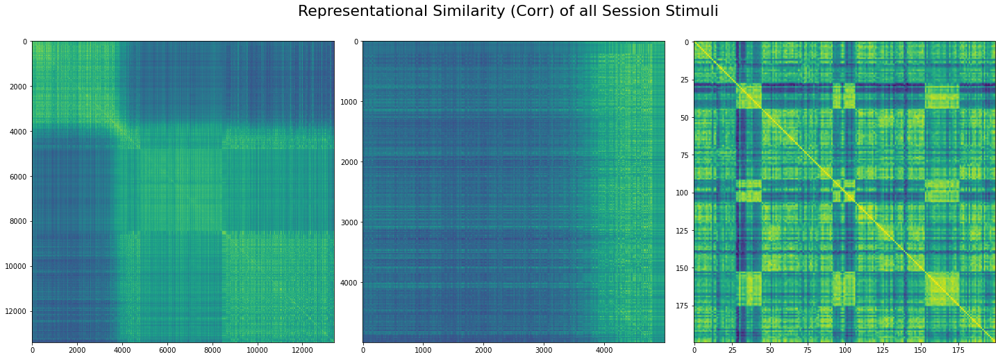

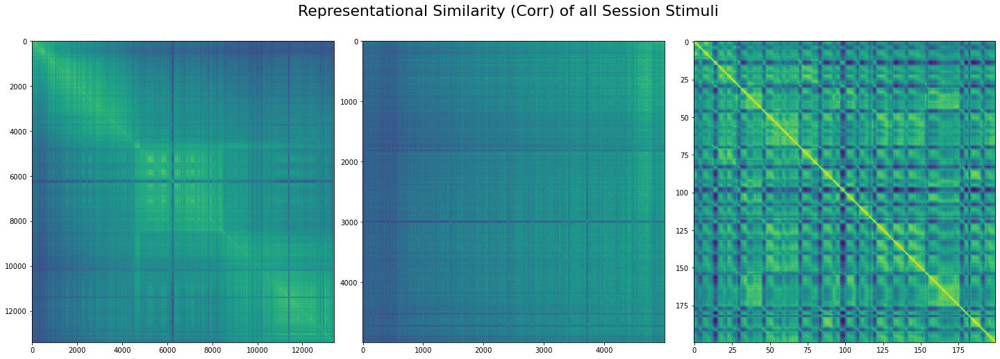

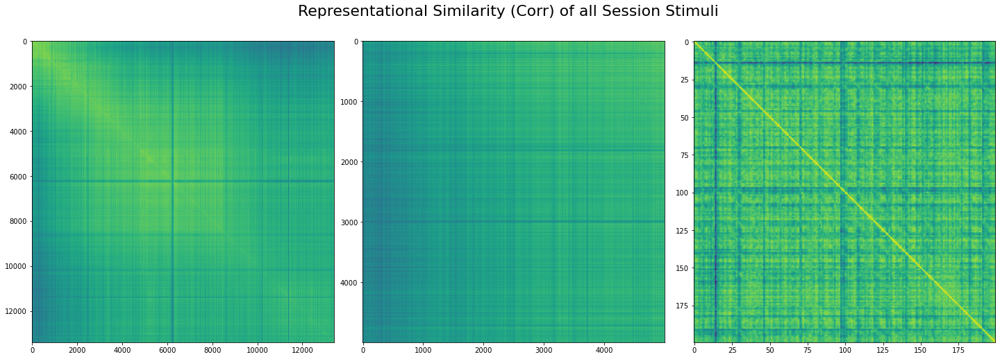

In [14]:
M_good_VISp = construct_unit_activity_population_response_matrix(good_VISp_units, spike_times, stimulus_presentations)
M_all_good = construct_unit_activity_population_response_matrix(good_units, spike_times, stimulus_presentations)
M_good_CA1 = construct_unit_activity_population_response_matrix(good_CA1_units, spike_times, stimulus_presentations)


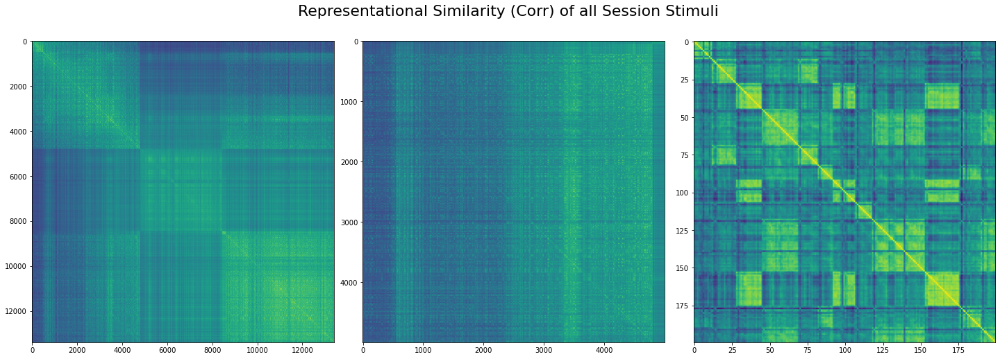

In [31]:
M_good_VIS = construct_unit_activity_population_response_matrix(good_VIS_units, spike_times, stimulus_presentations)

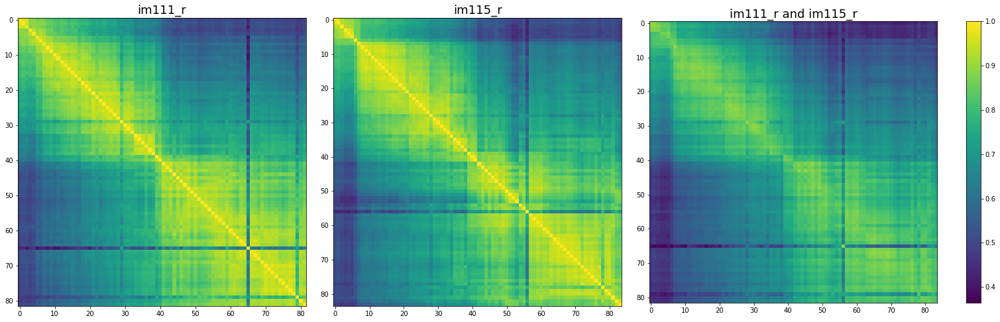

In [32]:
correlation_between_picture_pair('im111_r', 'im115_r', M_all_good, stimulus_presentations)

# Get Unit Activites for Fixed Images (averaged)

In [33]:
valid_images = []
for im in stimulus_presentations.image_name.unique():
    if (im != 'omitted') and (type(im) is not float):
        valid_images.append(im)
        
print(valid_images)


['im036_r', 'im083_r', 'im111_r', 'im012_r', 'im115_r', 'im044_r', 'im047_r', 'im078_r']


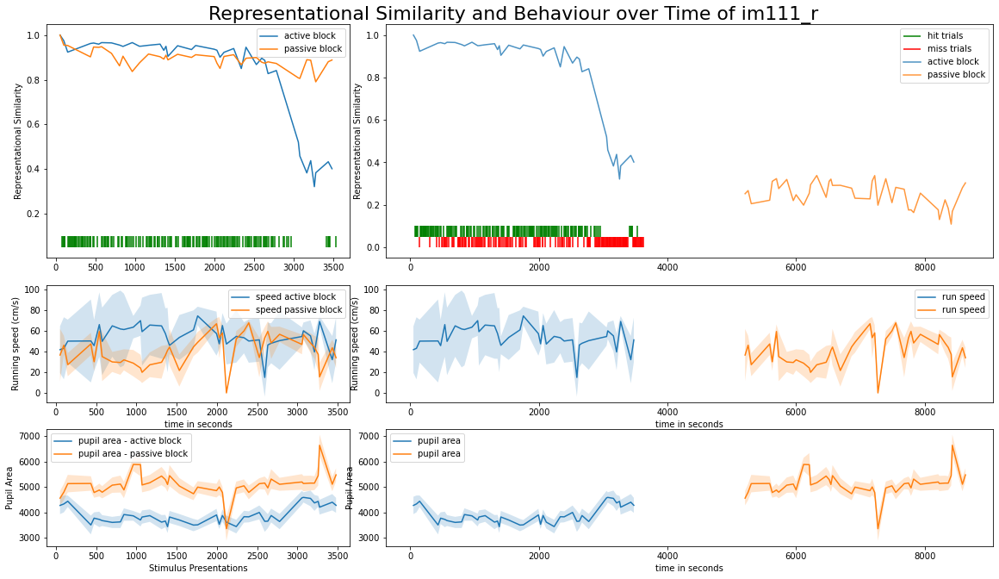

In [34]:
specific_image('im111_r', M_good_VISp, stimulus_presentations, running_speed, eye_tracking, change_trials)

In [35]:
colors = ['blue', 'orange', 'purple', 'firebrick', 'cornflowerblue', 'darkblue', 'magenta', 'green', 'thistle']

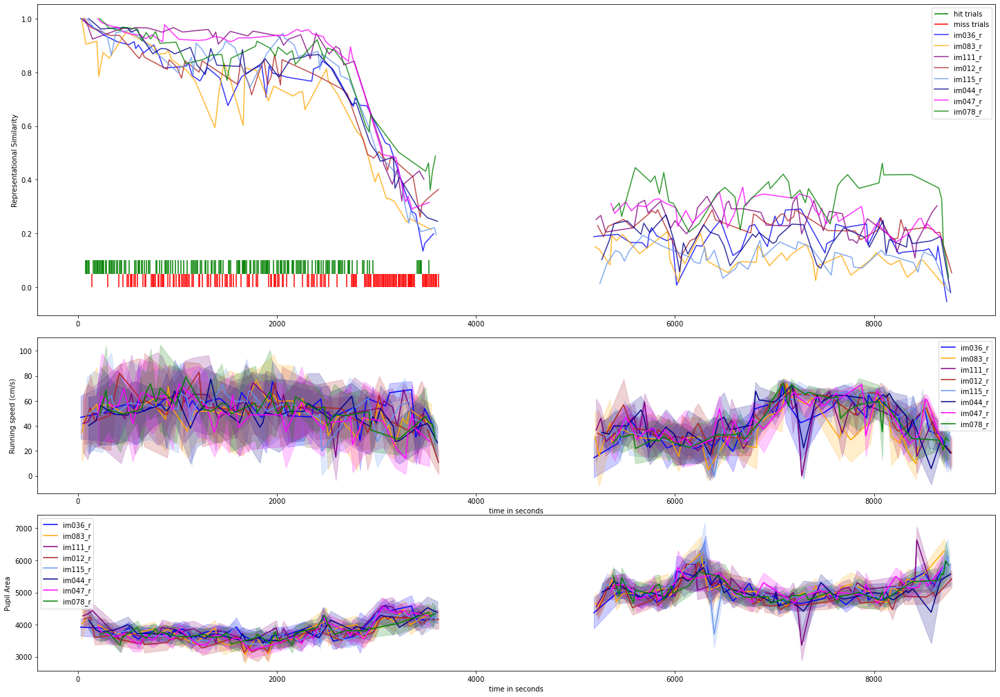

In [36]:
# print all images layered for M
plot_layered_RS_running_speed_and_pupil_area_all_images(valid_images, M_good_VISp, stimulus_presentations, running_speed, eye_tracking, colors, change_trials)


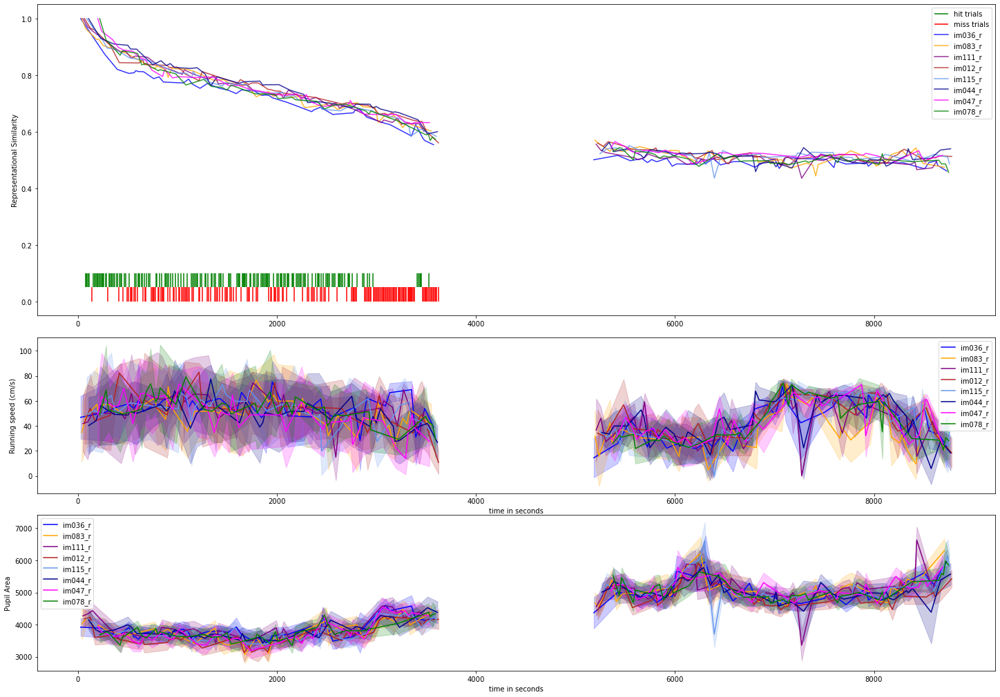

In [37]:
# print all images layered for M_all_good
plot_layered_RS_running_speed_and_pupil_area_all_images(valid_images, M_all_good, stimulus_presentations, running_speed, eye_tracking, colors, change_trials)


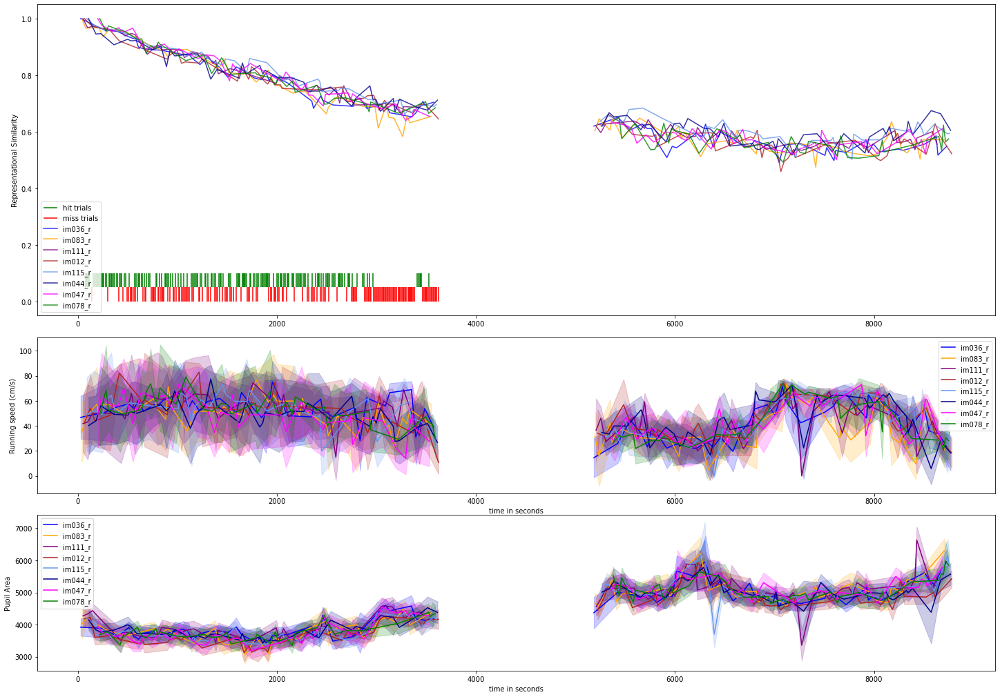

In [38]:
plot_layered_RS_running_speed_and_pupil_area_all_images(valid_images, M_good_CA1, stimulus_presentations, running_speed, eye_tracking, colors, change_trials)


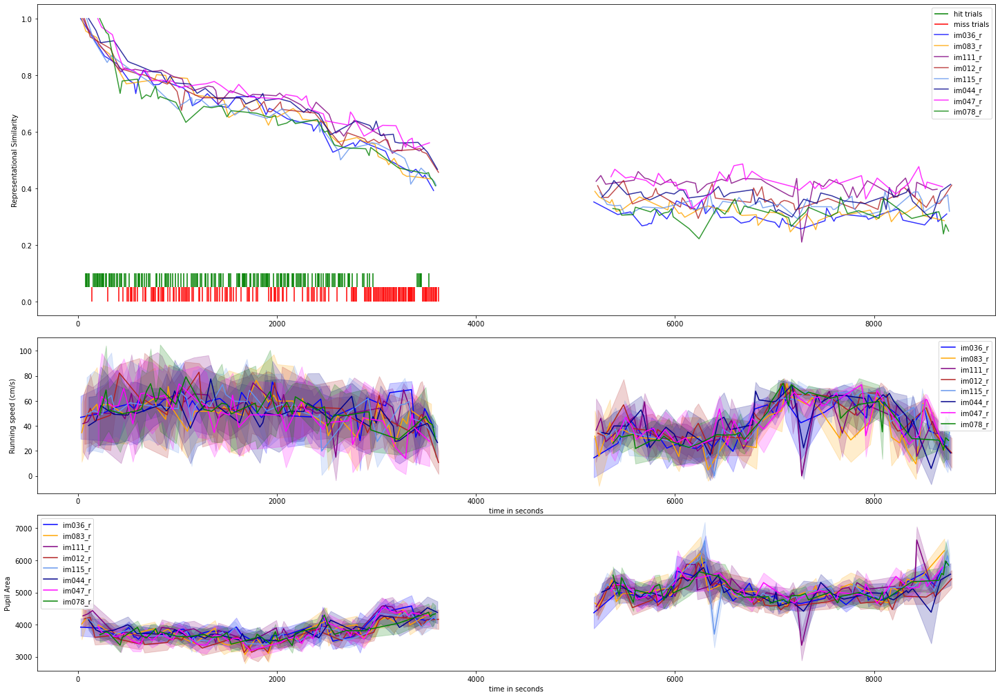

In [39]:
plot_layered_RS_running_speed_and_pupil_area_all_images(valid_images, M_good_VIS, stimulus_presentations, running_speed, eye_tracking, colors, change_trials)


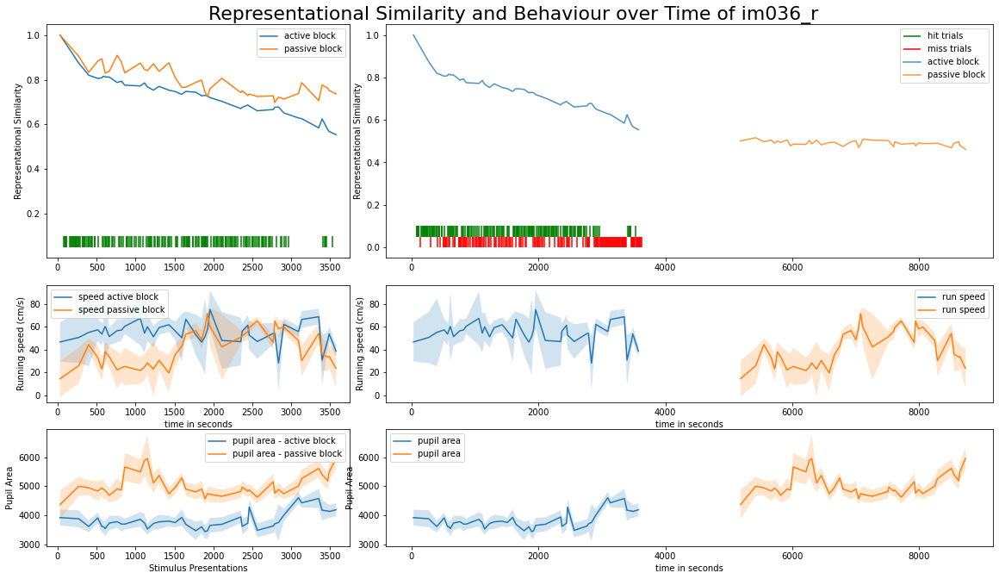

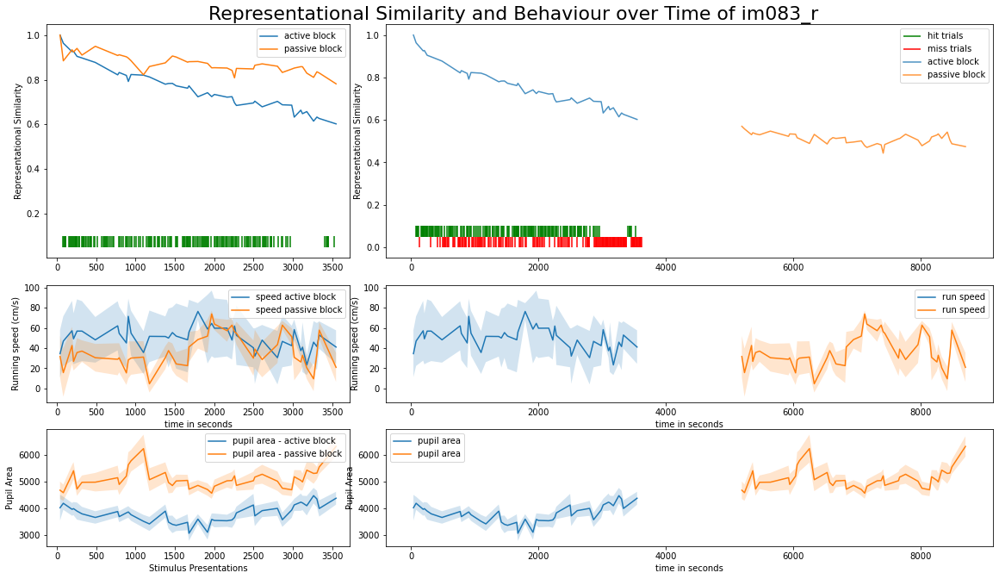

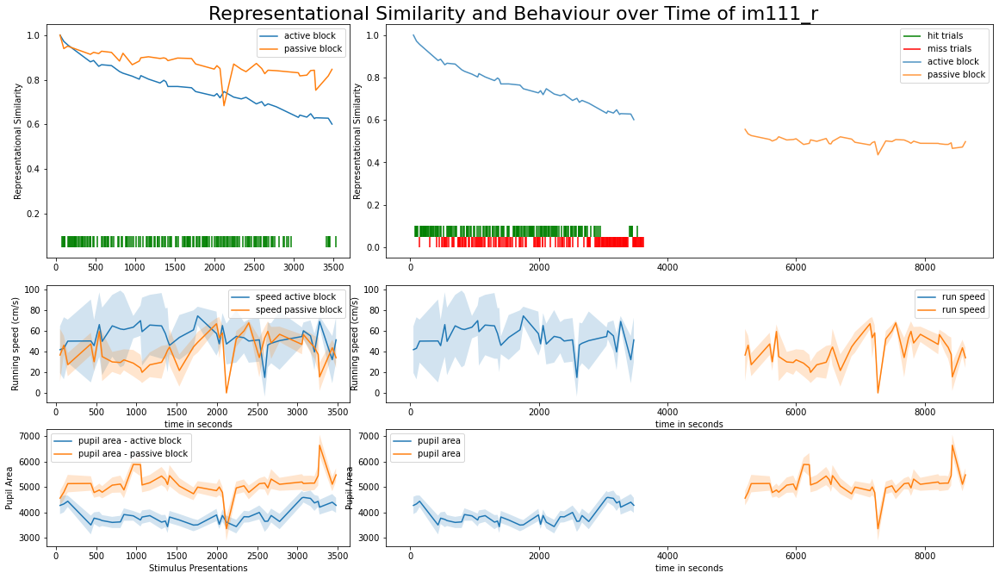

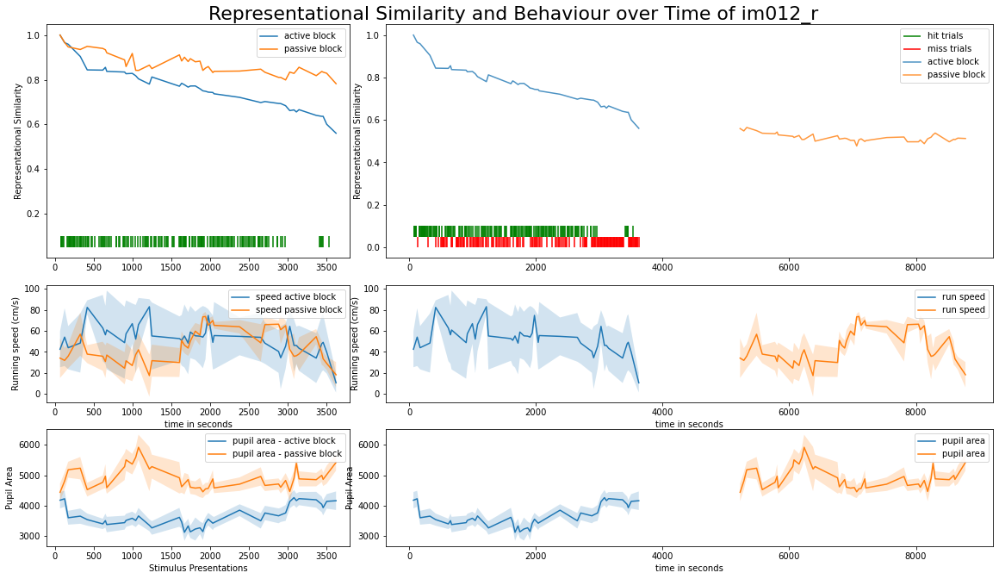

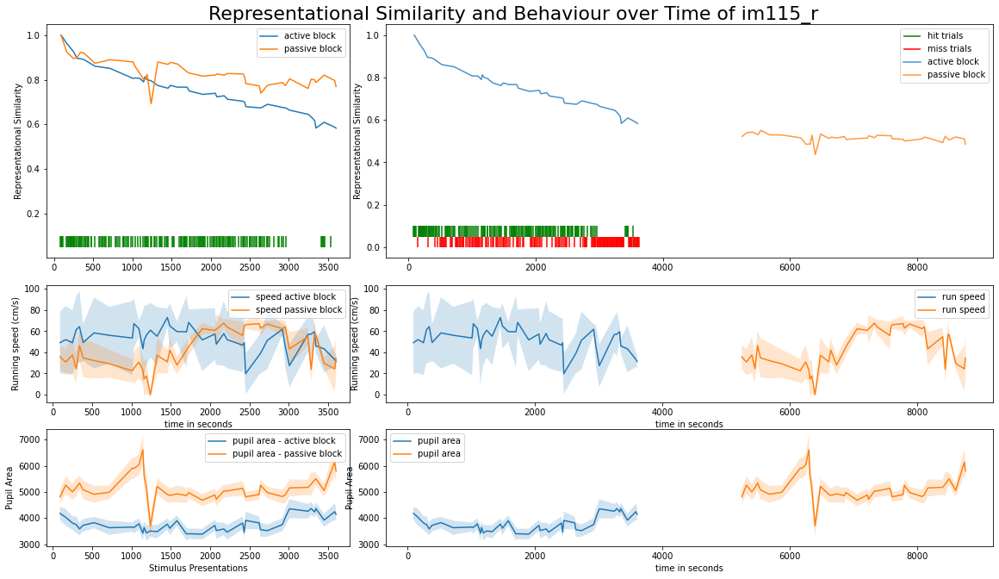

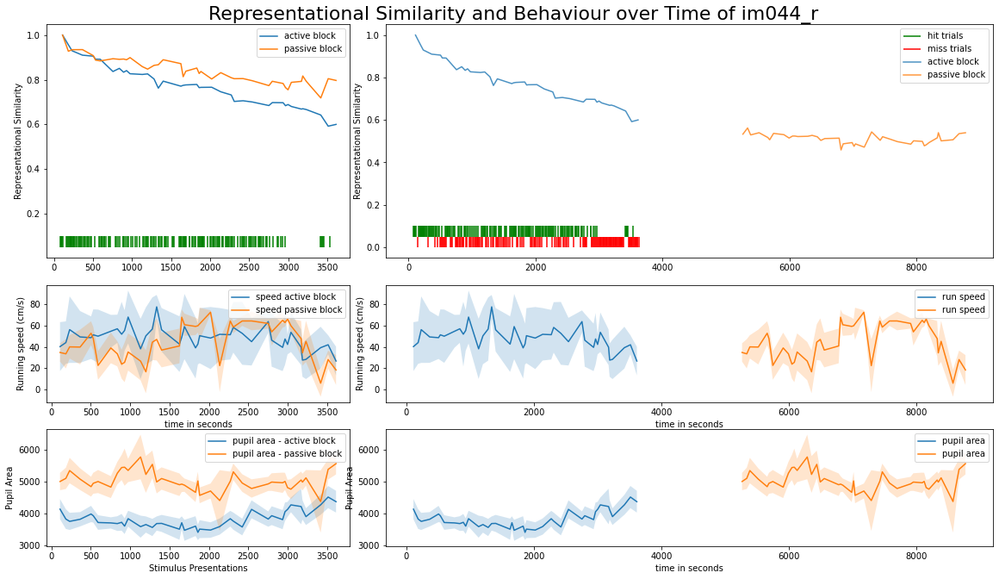

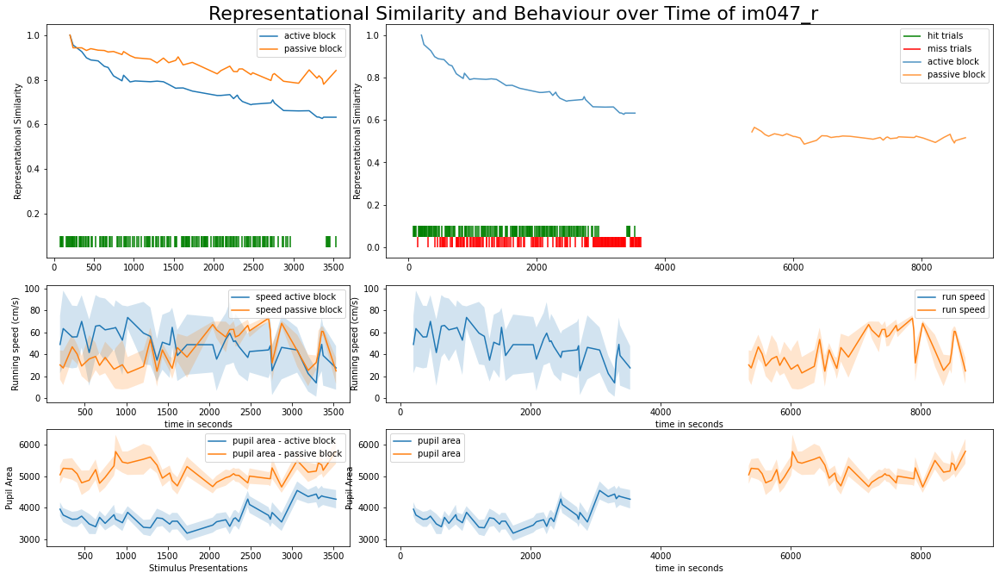

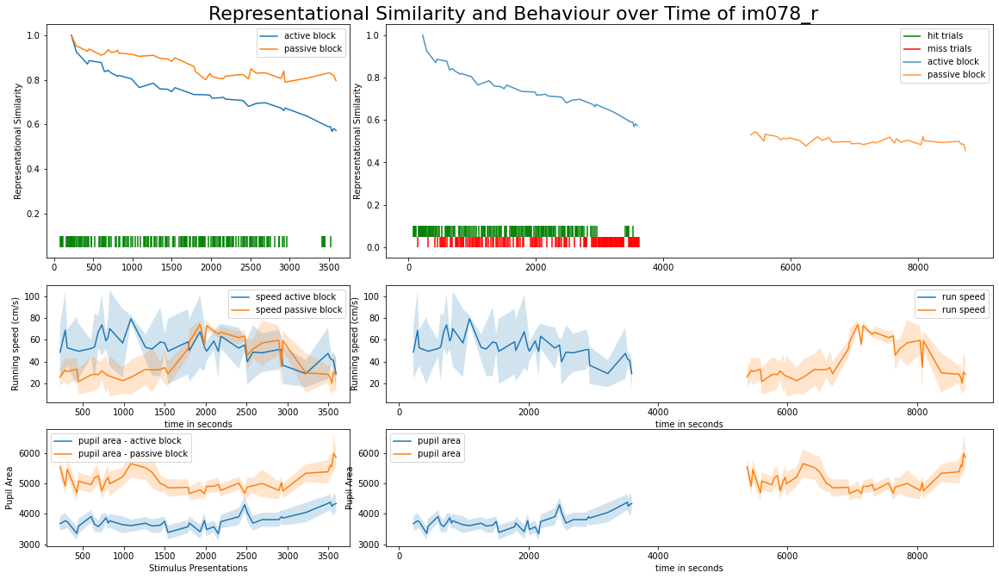

In [40]:
# print all images full information

for image in valid_images:
    specific_image(image, M_all_good, stimulus_presentations, running_speed, eye_tracking, change_trials)
    
    

#  2. Add CHAINS column to stimulus_presentations table

In [27]:
im_chains = count_all_same_image_appearences(stimulus_presentations)
stimulus_presentations['image_chain'] = im_chains
im111_sp = stimulus_presentations[stimulus_presentations['image_name']=='im111_r']
len(im111_sp[im111_sp['image_chain']==3.0])


12

#  3. Representational Similarity vs. delta V (behaviour)

In [41]:
from itertools import combinations, product

for pair in combinations(range(6), 2):
    i, j = pair
    print(i,j)
    
    
print('product: ')
a = range(3)
b = range(3, 6)
for pair in product(a,b):
    i, j = pair
    print(i,j)
    

0 1
0 2
0 3
0 4
0 5
1 2
1 3
1 4
1 5
2 3
2 4
2 5
3 4
3 5
4 5
product: 
0 3
0 4
0 5
1 3
1 4
1 5
2 3
2 4
2 5


In [42]:
# TODO: Regression and differentiation between active and passive block

(57, 1126) (57, 563) (57, 563)
1126 Int64Index([   28,    29,    30,    31,    32,    33,    34,    35,    36,
               37,
            ...
            13190, 13191, 13192, 13193, 13194, 13195, 13196, 13197, 13199,
            13200],
           dtype='int64', name='stimulus_presentations_id', length=1126)
563 563
number of data points:  563


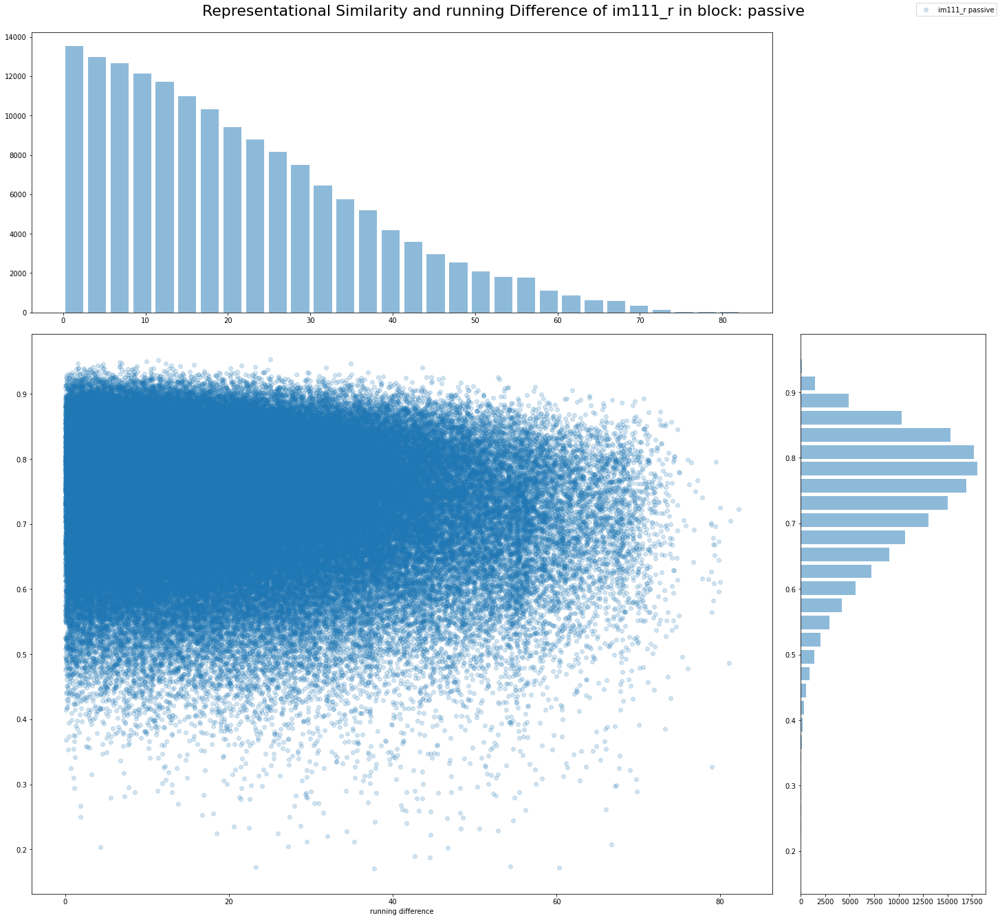

In [48]:
RS_vs_speed_active_passive('im111_r', M_good_VISp, stimulus_presentations, running_speed, eye_tracking,'running', 'passive')


number of data points:  82
im111_r
number of data points:  82
im111_r


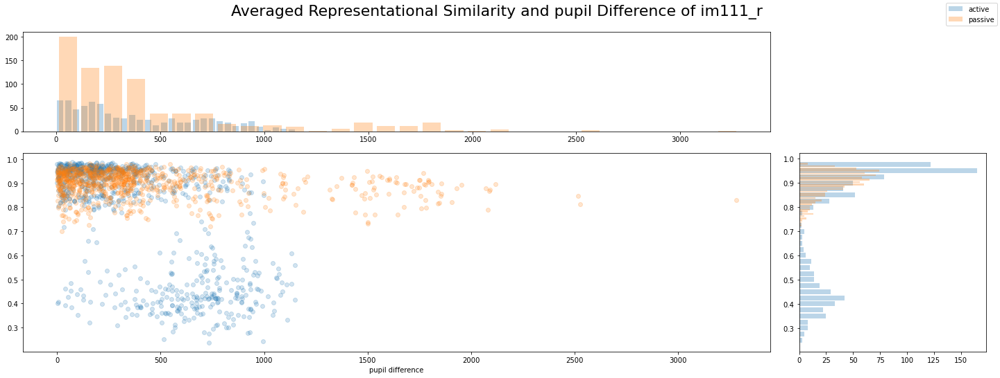

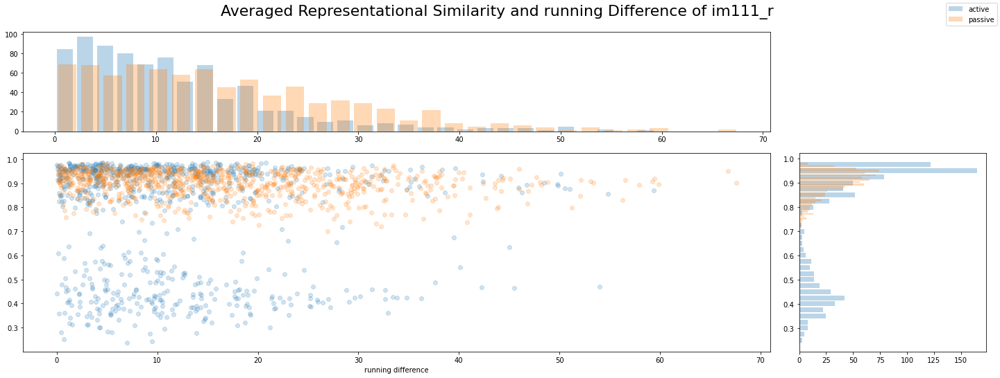

In [44]:
RS_vs_speed_avg_active_passive('im111_r', M_good_VISp, stimulus_presentations, running_speed, eye_tracking, 'pupil')
RS_vs_speed_avg_active_passive('im111_r', M_good_VISp, stimulus_presentations, running_speed, eye_tracking, 'running')

#  4. Representational Similarity vs. Time Difference

total number of data points:  82
im111_r


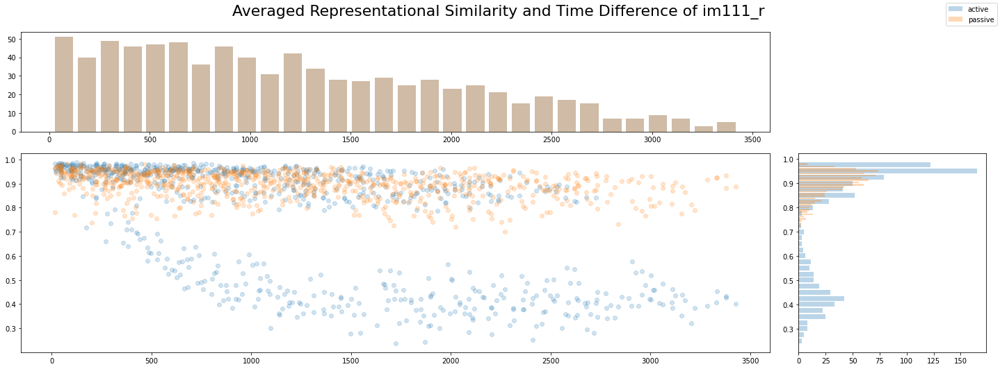

In [45]:
RS_vs_time_avg_active_passive('im111_r', M_good_VISp, stimulus_presentations)

In [ ]:
# TODO Time Difference vs Similarity for unavageraged data:
# AND consolidate all the functions, to try different session
# Take care of the Presentation slides /all needed plots

#  5. Within Chain Similarity

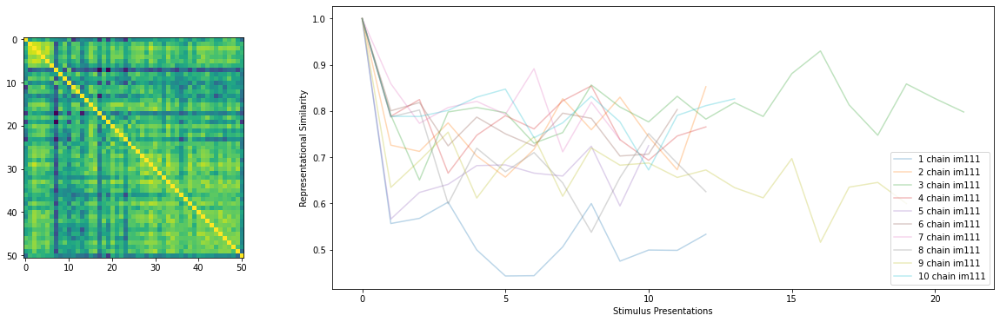

In [68]:

fig, axs = plt.subplots(1, 2, figsize=(20,6), gridspec_kw={'width_ratios': [1, 3]})

axs[0].imshow(C_chain)

for i in range(10):
    i += 1
    chain = im111_sp[im111_sp['image_chain']==float(i)]
    M_chain = M[:, chain.index]
    C_chain = np.corrcoef(np.transpose(M_chain))
    axs[1].plot(C_chain[0, :], alpha=0.3, label=f'{i} chain im111')
    #print(np.mean(C_chain[0, :]))


axs[1].set_ylabel('Representational Similarity')
axs[1].set_xlabel('Stimulus Presentations')
axs[1].legend()

